In [1]:
%reset

In [1]:
import sys
import os
import hydra
from omegaconf import DictConfig
import numpy as np
import torch
from tqdm.auto import tqdm
from PIL import Image
import json
from pytorch3d.io import load_objs_as_meshes, save_obj
from pytorch3d.structures import Meshes
from pytorch3d.renderer import (
    look_at_view_transform,
    FoVPerspectiveCameras,
    PointLights,
    RasterizationSettings,
    MeshRasterizer,
    MeshRenderer,
    SoftPhongShader,
    HardPhongShader,
    SoftSilhouetteShader,
    TexturesVertex,
)
from pytorch3d.renderer.blending import BlendParams, sigmoid_alpha_blend
from pytorch3d.io import IO
from pytorch3d.vis.plotly_vis import AxisArgs, plot_batch_individually, plot_scene
from pytorch3d.transforms import euler_angles_to_matrix
from pytorch3d.transforms.transform3d import Transform3d, Rotate, Translate, Scale
from pytorch3d.structures import join_meshes_as_batch, join_meshes_as_scene
from pytorch3d.utils import ico_sphere

import matplotlib.pyplot as plt

In [9]:
# setup cuda/cpu device
if torch.cuda.is_available():
    device = torch.device("cuda:0")
    torch.cuda.set_device(device=device)
    # clear cache
    torch.cuda.empty_cache()
else:
    device = torch.device("cpu")

DATA_DIR = "/home/kln/sandbox/cmu/repos/3d_project/dataset/"
kpts_file = os.path.join(DATA_DIR, "keypointnet/chair.json")
# kpts_file = os.path.join(DATA_DIR, "keypointnet/airplane.json")

model_file, kpts_xyz, kpts_rgb = None, None, None
with open(kpts_file) as f:
    kpts_dict = json.load(f)[0]  # load only first keypoint

    model_file = os.path.join(kpts_dict["class_id"], kpts_dict["model_id"])
    # model_file = os.path.join("02691156/5515a62182afd357f2b0736dd4d8afe0.ply")
    kpts_xyz = []
    kpts_rgb = []
    kpts_faces = []
    for kpt in kpts_dict["keypoints"]:
        kpts_xyz.append(kpt["xyz"])
        kpts_rgb.append(kpt["rgb"])
        kpts_faces.append(kpt["mesh_info"]["face_index"])
    kpts_xyz = torch.tensor(kpts_xyz)
    kpts_rgb = torch.tensor(kpts_rgb)
    kpts_faces = torch.tensor(kpts_faces)

kpts_xyz, kpts_rgb, kpts_faces = (
    kpts_xyz.to(device),
    kpts_rgb.to(device),
    kpts_faces.to(device),
)
# ply_file = os.path.join(DATA_DIR, "keypointnet/ShapeNetCore.v2.ply", model_file+".ply")
# mesh = IO().load_mesh(ply_file, device=device)
obj_file = os.path.join(DATA_DIR, "ShapeNetCore.v2", model_file, "models/model_normalized.obj")
mesh = load_objs_as_meshes([obj_file], device=device)


In [20]:
# We scale normalize and center the target mesh to fit in a sphere of radius 1
# centered at (0,0,0). (scale, center) will be used to bring the predicted mesh
# to its original center and scale.  Note that normalizing the target mesh,
# speeds up the optimization but is not necessary!
verts = mesh.verts_packed()
N = verts.shape[0]
center = verts.mean(0)
scale = max((verts - center).abs().max(0)[0])
mesh.offset_verts_(-center)
mesh.scale_verts_((1.0 / float(scale)))
# nomalize keypoints also
scale = max((kpts_xyz - center).abs().max(0)[0])
kpts_xyz = kpts_xyz - center
kpts_xyz = kpts_xyz * (1.0 / float(scale))

sphere_mesh = ico_sphere(4, device)
verts = sphere_mesh.verts_packed()
center = verts.mean(0)
scale = max((verts - center).abs().max(0)[0])
sphere_mesh.offset_verts_(-center)
sphere_mesh.scale_verts_((1.0 / float(scale)))
sphere_mesh.scale_verts_(0.01)

/home/kln/miniconda3/envs/16889/lib/python3.9/site-packages/pytorch3d/structures/meshes.py:1108: UserWarning:

__floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').



In [37]:
cam_dist = 3
elev = 0
azim = 130

# Place a point light in front of the object. As mentioned above, the front of
# the object is facing the -z direction.
lights = PointLights(device=device, location=[[0.0, 0.0, -cam_dist]])

# Initialize an OpenGL perspective camera that represents a batch of different
# viewing angles. All the cameras helper methods support mixed type inputs and
# broadcasting. So we can view the camera from the a distance of dist=2.7, and
# then specify elevation and azimuth angles for each viewpoint as tensors.
R, T = look_at_view_transform(dist=cam_dist, elev=elev, azim=azim)
cameras = FoVPerspectiveCameras(device=device, R=R, T=T)

In [38]:
sphere_verts = sphere_mesh.verts_padded()
texture_rgb = torch.ones_like(sphere_verts) * torch.tensor([255, 0, 0]).to(
    device
)
texture = TexturesVertex(texture_rgb)
text_sphere_mesh = Meshes(sphere_verts, sphere_mesh.faces_padded(), texture)
spheres = text_sphere_mesh.extend(kpts_xyz.shape[0])
transform = Transform3d(device=device).compose(
    Translate(kpts_xyz, device=device)
)
spheres = spheres.update_padded(
    transform.transform_points(spheres.verts_padded())
)

verts = mesh.verts_padded()
faces = mesh.faces_padded()
texture_rgb = torch.ones_like(verts) * torch.tensor([0, 255, 0]).to(
    device
)
texture_rgb = (verts - verts.min()) / (verts.max() - verts.min())
texture = TexturesVertex(texture_rgb)
chair_mesh = Meshes(verts, faces, texture)
meshes = join_meshes_as_batch([chair_mesh, spheres])


In [39]:
# show scene rendering for debugging
scene = plot_scene({
    "figure": {
        "Mesh": meshes,
        "Camera": cameras
    }
})
scene.show()

/home/kln/miniconda3/envs/16889/lib/python3.9/site-packages/pytorch3d/transforms/transform3d.py:780: UserWarning:

R is not a valid rotation matrix



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1024, 1024)
1.0


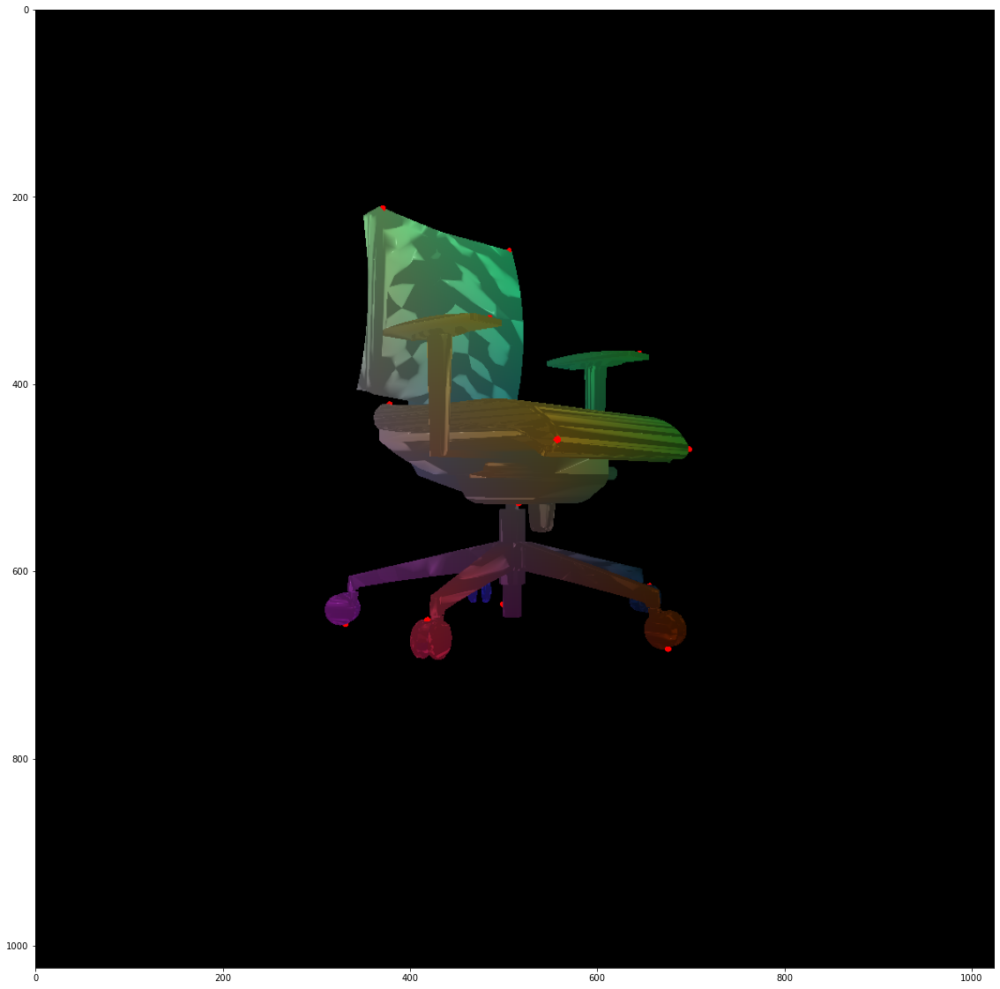

In [40]:
image_size=1024
renderer = MeshRenderer(
    rasterizer=MeshRasterizer(
        raster_settings=RasterizationSettings(
            image_size=image_size, blur_radius=0.0, faces_per_pixel=1
        )
    ),
    shader=HardPhongShader(
        device=device,
        lights=lights,
        cameras=cameras,
        blend_params=BlendParams(
            background_color=(0,0,0)
        )
    )
)

rendered_images = renderer(join_meshes_as_scene([chair_mesh, spheres]), cameras=cameras)
# rendered_images = renderer(join_meshes_as_scene([mesh.extend(len(cameras))]), cameras=cameras)
image = rendered_images[0].cpu().numpy()
plt.figure(figsize=(20,20))
plt.imshow(image[...,:3])
print(image[...,3].shape)
print(image[...,3].max())

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


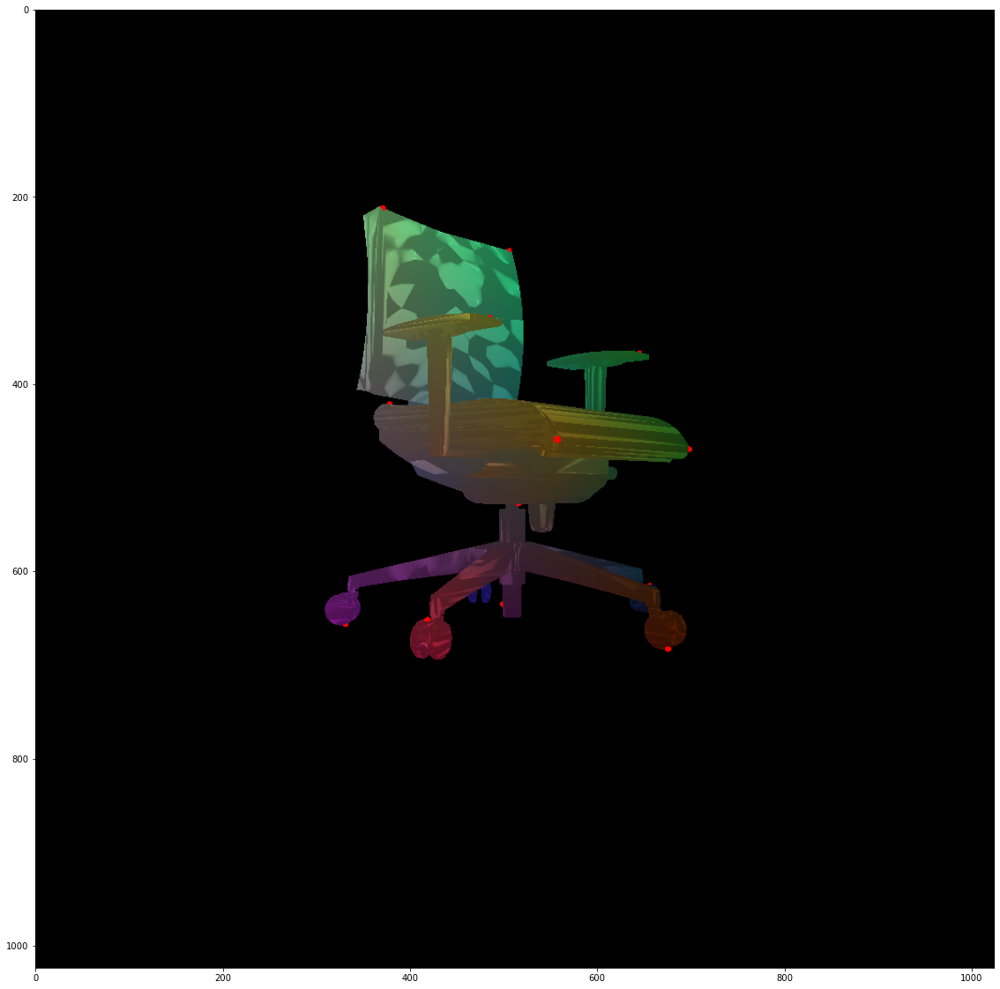

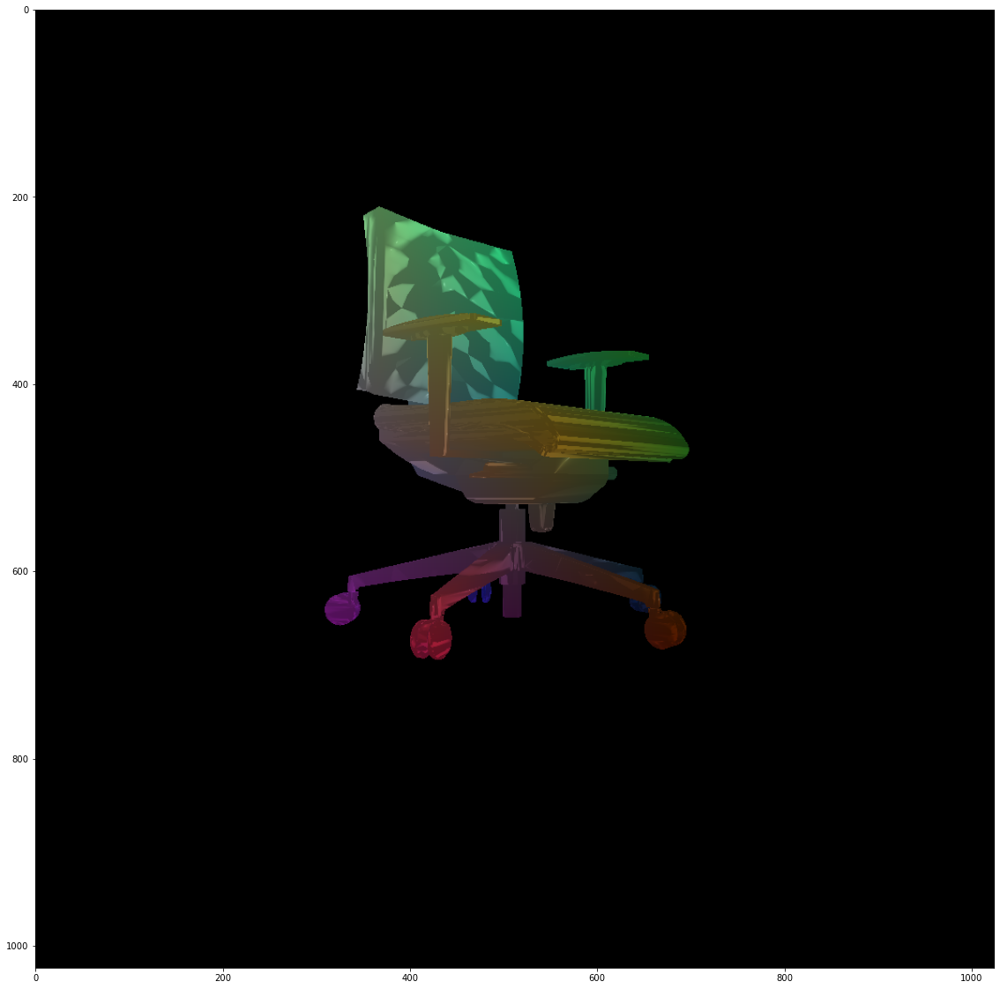

In [41]:
# custome Renderer to get depth
class MeshRendererWithDepth(torch.nn.Module):
    def __init__(self, rasterizer, shader):
        super().__init__()
        self.rasterizer = rasterizer
        self.shader = shader

    def forward(self, meshes_world, **kwargs) -> torch.Tensor:
        fragments = self.rasterizer(meshes_world, **kwargs)
        images = self.shader(fragments, meshes_world, **kwargs)
        return images, fragments.zbuf

image_size=1024
renderer = MeshRendererWithDepth(
    rasterizer=MeshRasterizer(
        raster_settings=RasterizationSettings(
            image_size=image_size, blur_radius=0.0, faces_per_pixel=1
        )
    ),
    shader=HardPhongShader(
        device=device,
        lights=lights,
        cameras=cameras,
        blend_params=BlendParams(
            background_color=(0,0,0)
        )
    )
)

rendered_images, rendered_depth = renderer(join_meshes_as_scene([chair_mesh, spheres]), cameras=cameras)
image = rendered_images[0].cpu().numpy()
plt.figure(figsize=(20,20))
plt.imshow(image[...,:3])

rendered_images, rendered_depth = renderer(join_meshes_as_batch([chair_mesh, spheres]), cameras=cameras)
image = rendered_images[0].cpu().numpy()
plt.figure(figsize=(20,20))
plt.imshow(image[...,:3])

0 3.0
1 6.0
2 9.0
3 12.0
4 20.0
5 18.0
6 21.0
7 24.0
8 27.0
9 30.0
10 44.0
11 36.0
12 39.0
13 28.0
14 45.0
15 48.0
16 51.0


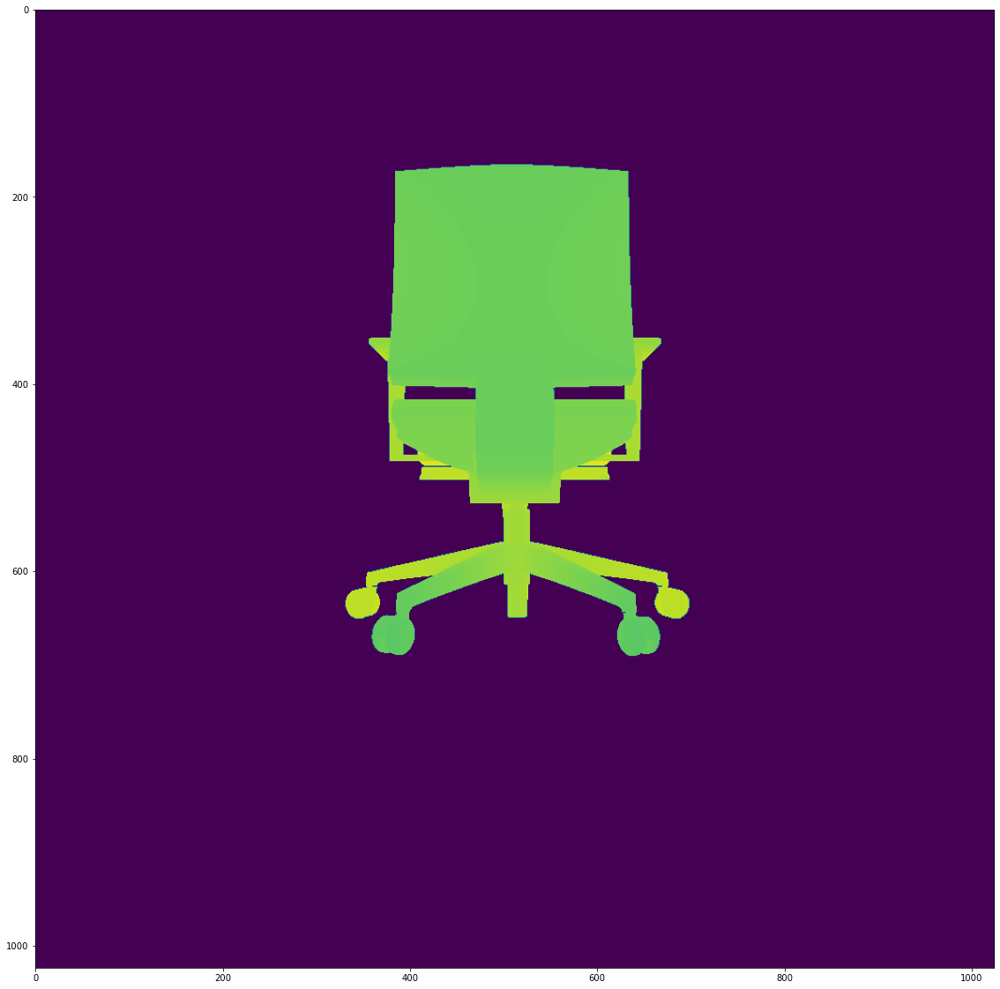

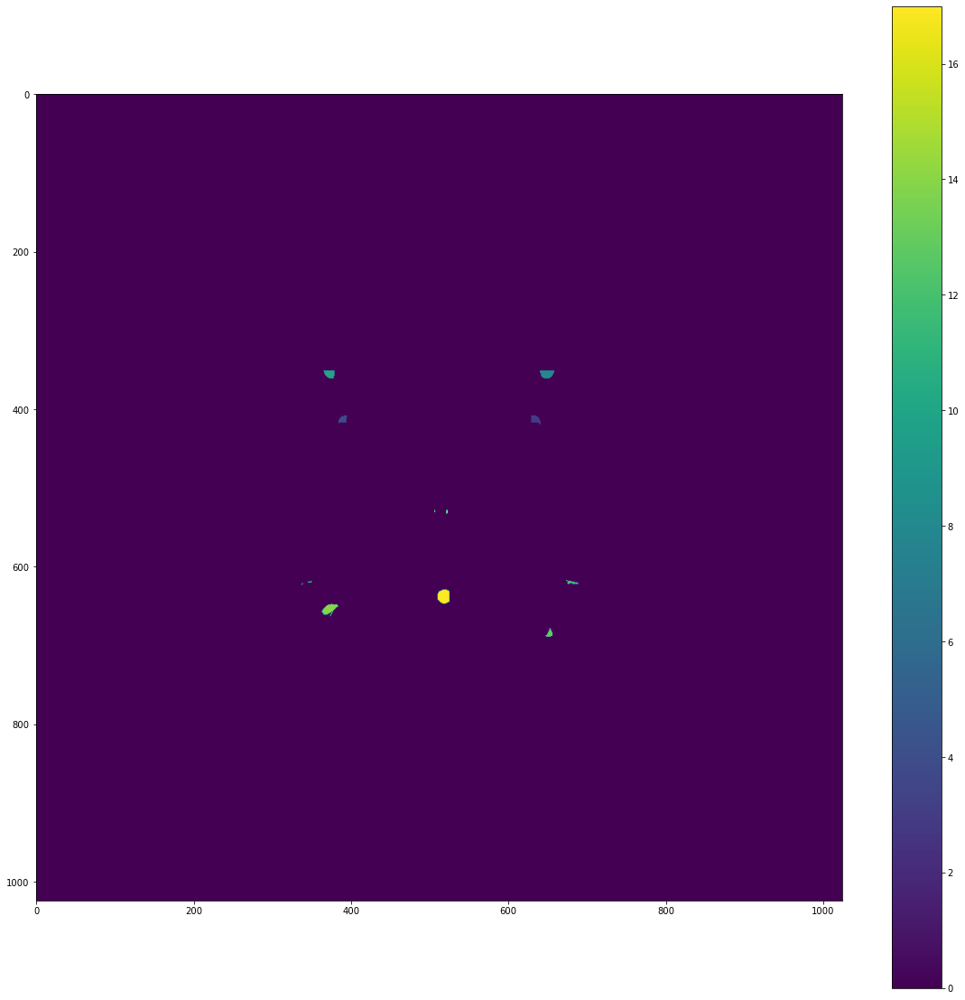

In [11]:
depth_maps = rendered_depth.cpu().numpy()
chair_depth = depth_maps[0]
plt.figure(figsize=(20,20))
plt.imshow(chair_depth)

kpts_layers = []
map = {}
for i, kpt_depth in enumerate(depth_maps[1:]):
    mask = kpt_depth > 0
    d = kpt_depth.max().round() * (i+1)
    map[d] = i+1
    print(i,d)
    fg = kpt_depth < chair_depth
    img = np.zeros_like(fg) + (np.ones_like(fg)*d) * fg
    img = img * mask
    kpts_layers.append(img)

kpts_layers = np.stack(kpts_layers)
kpts = np.max(kpts_layers,axis=0)

for d,i in map.items():
    x = np.where(kpts == d)
    kpts[x] = i
plt.figure(figsize=(20,20))
plt.imshow(kpts)
plt.colorbar()

In [94]:
kpts.shape

(1024, 1024, 1)

In [59]:
# Custome Shader class to obtain object mask
class MaskShader(torch.nn.Module):
    def __init__(self, device="cpu"):
        super().__init__()

    def forward(self, fragments, meshes, **kwargs) -> torch.Tensor:
        N, H, W, K = fragments.pix_to_face.shape
        device = fragments.pix_to_face.device

        # background mask
        is_background = fragments.pix_to_face[..., 0] < 0
        is_background = is_background.unsqueeze(3)
        bg = torch.zeros((N, H, W, 1)).to(device)
        # fg = torch.stack([torch.ones(H, W, 1) * i for i in range(N + 1, 1, -1)]).to(device)
        fg = torch.stack([torch.ones(H, W, 1) * i for i in range(1, N+1, 1)]).to(device)
        images = bg + (~is_background * fg)
        return images  # (N, H, W, 1) RGBA image

image_size=256
sigma = 1e-4
raster_settings = RasterizationSettings(
    image_size=image_size,
    blur_radius=np.log(1.0 / 1e-4 - 1.0) * sigma,
    faces_per_pixel=50,
)

renderer = MeshRenderer(
    rasterizer=MeshRasterizer(raster_settings=raster_settings), shader=MaskShader()
)

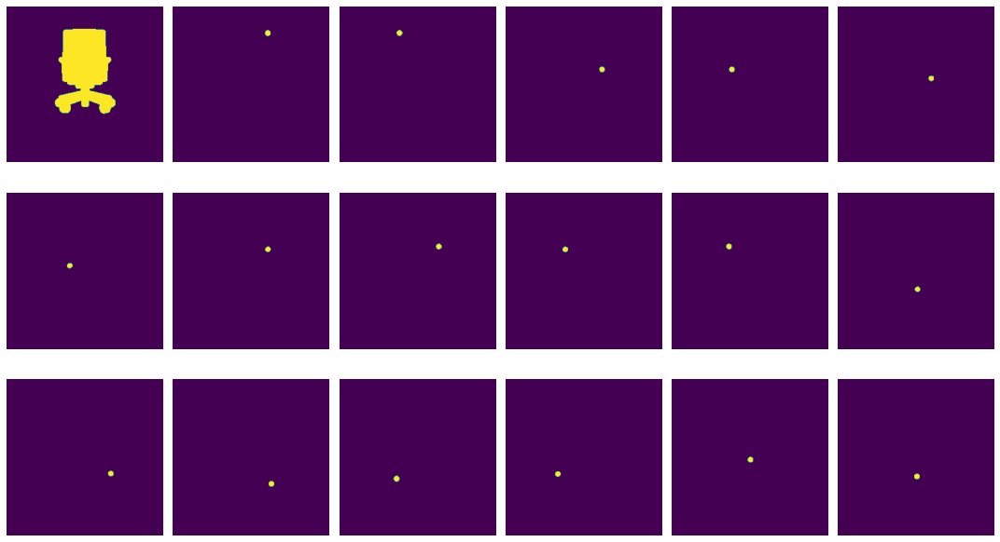

In [60]:
rendered_images = renderer(meshes, cameras=cameras) # generate masks for only obj meshes without bin
fig, axs = plt.subplots(3, 6, figsize=(15,9))
bleed = 0
fig.subplots_adjust(left=bleed, bottom=bleed, right=(1-bleed), top=(1-bleed))
for ax, im in zip(axs.ravel(), rendered_images.cpu().numpy()):
    ax.imshow(im[...,0])
    ax.set_axis_off()
plt.tight_layout()
plt.show()

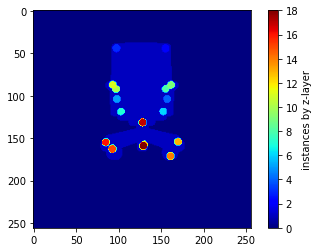

In [61]:
masks = rendered_images.cpu().numpy()
single_mask = masks.max(axis=0)
# cv2.imwrite("modal_segmask.png", single_mask)
plt.figure()
plt.imshow(single_mask, cmap='jet')
plt.colorbar(label='instances by z-layer')

19.0


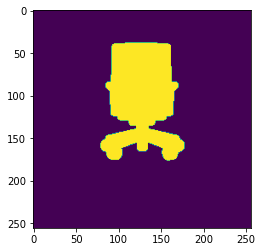

In [16]:
plt.imshow(masks[0])    
print(masks[0].max())